<a href="https://colab.research.google.com/github/zubair9519/zubair9519/blob/main/web_scraping%2024_8_2024_AllSitesCode.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Start of the coding -- Installing of puppeteer


In [9]:
!pip install pyppeteer nest_asyncio

import asyncio
from pyppeteer import launch
import nest_asyncio
from IPython.display import Image

# Apply the nest_asyncio patch to allow nested event loops in Google Colab
nest_asyncio.apply()

async def scraper():
    # Launch the browser
    browser = await launch(headless=True, args=['--no-sandbox', '--disable-gpu'])
    page = await browser.newPage()

    # Set the viewport of the page
    await page.setViewport({"width": 1280, "height": 720})

    # Visit the target website
    await page.goto("https://emrdeliverybody.nationalgrideso.com/IG/s/article/Capacity-Market-Operational-Plan", timeout=60000)

    # Wait for the page content to load
    await page.waitForSelector("div.slds-rich-text-editor__output")

    # Grab a full-page screenshot of the web page
    screenshot_path = "full-page-screenshot.png"
    await page.screenshot(path=screenshot_path, fullPage=True)

    # Extract the main content
    content_element = await page.querySelector("div.slds-rich-text-editor__output")
    content_text = await content_element.getProperty("textContent")

    # Print the extracted content
    print(await content_text.jsonValue())

    # Close the browser
    await browser.close()

    return screenshot_path

# Run the scraper function and get the path of the screenshot
screenshot_path = await scraper()

# Display the screenshot in the notebook
Image(screenshot_path)


ERROR: Operation cancelled by user


CancelledError: 

## Checking to see the code for a random website, if it able to extract text and take screenshot

­.fluid-width-video-wrapper{width:100%;position:relative;padding:0;}.fluid-width-video-wrapper iframe,.fluid-width-video-wrapper object,.fluid-width-video-wrapper embed {position:absolute;top:0;left:0;width:100%;height:100%;}

Powered by CookiebotZustimmungDetails[#IABV2SETTINGS#]Über Cookiespv magazine respektiert Ihre PrivatsphäreWir verwenden auf unserer Webseite Cookies und ähnliche Technologien um Ihnen eine benutzerfreundliche, sichere und effektive Website zur Verfügung zu stellen. Zusätzlich nutzen wir diese Technologien, um Ihnen persönliche Werbung bereitstellen zu können. Wenn Sie damit einverstanden sind, klicken Sie bitte auf „Cookies akzeptieren“. Um persönliche Einstellung der Cookies vorzunehmen, wählen Sie „Cookie-Einstellungen“. Bitte berücksichtigen Sie, dass die Darstellung unserer Webseite durch Ihre Auswahl der Cookies beeinflusst wird.   Ihre erteilte Einwilligung zur Verwendung von Cookies können Sie jederzeit über unseren Cookie-Banner widerrufen bzw. ändern. W

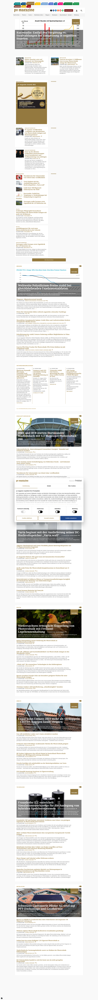

In [ ]:
import asyncio
from pyppeteer import launch
import nest_asyncio
from IPython.display import Image, display

# Apply the nest_asyncio patch to allow nested event loops
nest_asyncio.apply()

async def scraper(url, block_resources=False, timeout=60000):
    try:
        # Launch the browser with the ability to block unnecessary resources
        browser = await launch(headless=True, args=['--no-sandbox', '--disable-gpu'])
        page = await browser.newPage()

        # Conditionally block resources like images and fonts
        if block_resources:
            await page.setRequestInterception(True)
            page.on('request', lambda request: asyncio.ensure_future(
                request.continue_() if request.resourceType in ['document', 'script', 'xhr', 'fetch', 'stylesheet'] else request.abort()
            ))

        # Set the viewport of the page
        await page.setViewport({"width": 1280, "height": 720})

        # Attempt to visit the target website with a given timeout
        await page.goto(url, timeout=timeout)

        # Wait for the page content to load
        await page.waitForSelector("body", {"timeout": 60000})

        # Adding a delay to ensure that JavaScript-rendered content is fully loaded
        await asyncio.sleep(5)

        # Try different ways to extract the main content
        content_text = ""
        for selector in ["article", "div", "p", "section"]:
            try:
                content_elements = await page.querySelectorAll(selector)
                if content_elements:
                    content_text = "\n".join(
                        [await (await element.getProperty("textContent")).jsonValue() for element in content_elements]
                    )
                    break
            except Exception as e:
                print(f"Error extracting content with selector {selector}: {e}")

        # If no content is extracted, default to an empty string
        if not content_text:
            content_text = "No content could be extracted."

        # Print the extracted content
        print(content_text)

        # Grab a full-page screenshot of the web page
        screenshot_path = "full-page-screenshot.png"
        await page.screenshot(path=screenshot_path, fullPage=True)

        # Close the browser
        await browser.close()

        return screenshot_path

    except Exception as e:
        print(f"An error occurred: {e}")
        return None

# URL of the website to scrape
url = "https://www.pv-magazine.de/"

# Run the scraper function and get the path of the screenshot
screenshot_path = await scraper(url, block_resources=False, timeout=90000)

# Display the screenshot in the notebook
if screenshot_path:
    display(Image(screenshot_path))
else:
    print("Screenshot could not be taken.")


## for this website, it appeared that cookie blocker was blocking the way to read the website. in the part of code, first queryselector was used to spot "cookies all accept" button, but it turned out it was shadowed8 (by using the console in browser), so shadowed part was used to click all accept button

Suche
Kontakt
Glossar
Web API
DE
EN
Extranet
TAM-Meldeportal
Über uns
Über uns
Aufgaben
Aufgabe der SG HoBA
Planung und Betrieb des deutschen Übertragungsnetzes
Aktuelles
Pressebereich
Netzentgelte
Studien und Positionspapiere
Informationsplattformen
Veröffentlichungspflichten gemäß EU-Transparenzverordnung
TAM-Meldeportal
Erneuerbare Energien und Umlagen
Erneuerbare Energien und Umlagen
EEG
EEG-Finanzierung
EEG-Abrechnungen
Transparenzanforderungen
Archiv
KWKG
KWKG-Umlage
KWKG-Abrechnung
Transparenzanforderungen
Sonstige Umlagen
Offshore-Netzumlage
§ 19 StromNEV-Umlage
§ 18 AbLaV-Umlage
Freiwillige Veröffentlichungen
Wind- und Solarenergie Hochrechnung
Wind- und Solarenergie Prognose (bis 15.12.2022)
Regelenergie
Regelenergie
Ausgleichsenergiepreis
reBAP
AEP-Module
Finanzielle Wirkung der AEP-Module
AEP-Schätzer
Index Ausgleichsenergiepreis
Value of Avoided Activation (VoAA)
NRV- und RZ-Saldo
NRV-Saldo-Ampel
NRV-Saldo
RZ-Saldo
Daten Regelreserve
Aktivierte Regelleistung
Optimierte Reg

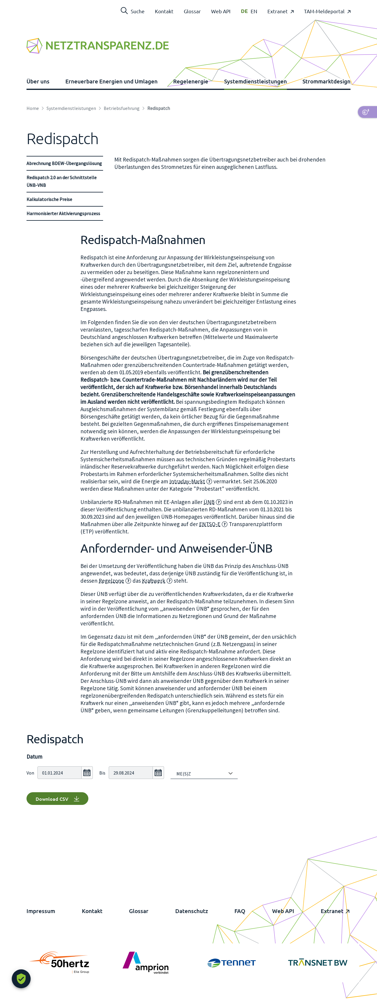

In [ ]:
import asyncio
from pyppeteer import launch
import nest_asyncio
from IPython.display import Image, display

# Apply the nest_asyncio patch to allow nested event loops
nest_asyncio.apply()

async def scraper(url, block_resources=False, timeout=60000):
    try:
        # Launch the browser and create a new page
        browser = await launch(headless=True, args=['--no-sandbox', '--disable-gpu'])
        page = await browser.newPage()

        # Optionally block resources
        if block_resources:
            await page.setRequestInterception(True)
            page.on('request', lambda request: asyncio.ensure_future(
                request.continue_() if request.resourceType in ['document', 'script', 'xhr', 'fetch', 'stylesheet'] else request.abort()
            ))

        # Set the viewport and navigate to the URL
        await page.setViewport({"width": 1280, "height": 720})
        await page.goto(url, timeout=timeout)

        # Wait for the page to load and ensure everything is rendered
        await page.waitForSelector("body", {"timeout": 60000})
        await asyncio.sleep(15)  # Ensure all elements are loaded

        # Handle the consent box within the Shadow DOM
        try:
            await page.evaluate('''() => {
                const shadowHost = document.querySelector('#usercentrics-root');
                if (shadowHost) {
                    const shadowRoot = shadowHost.shadowRoot;
                    const button = shadowRoot.querySelector('button[data-testid="uc-accept-all-button"]');
                    if (button) {
                        button.click();
                    }
                }
            }''')
            await asyncio.sleep(5)  # Wait for the banner to disappear
        except Exception as e:
            print(f"Error clicking accept button in Shadow DOM: {e}")

        # Extract content from the page
        try:
            # Wait for specific content to be loaded
            await page.waitForSelector("div", {"timeout": 60000})
            content_text = await page.evaluate('''() => {
                let textContent = "";
                const elements = document.querySelectorAll("article, div, p, section");
                elements.forEach(element => {
                    if (element.innerText) {
                        textContent += element.innerText + "\\n";
                    }
                });
                return textContent;
            }''')
        except Exception as e:
            print(f"Error extracting content: {e}")
            content_text = "No content could be extracted."

        print(content_text)

        # Take a screenshot
        screenshot_path = "full-page-screenshot.png"
        await page.screenshot(path=screenshot_path, fullPage=True)

        # Close the browser
        await browser.close()

        return screenshot_path

    except Exception as e:
        print(f"An error occurred: {e}")
        return None

# Define the URL you want to scrape
url = "https://www.netztransparenz.de/de-de/Systemdienstleistungen/Betriebsfuehrung/Redispatch"

# Run the scraper function
screenshot_path = await scraper(url, block_resources=False, timeout=90000)

if screenshot_path:
    display(Image(screenshot_path))
else:
    print("Screenshot could not be taken.")


## after the above exercise, it appeared that even accepting, text was not being read so problem was something else

Suche
Kontakt
Glossar
Web API
DE
EN
Extranet
TAM-Meldeportal
Über uns
Über uns
Aufgaben
Aufgabe der SG HoBA
Planung und Betrieb des deutschen Übertragungsnetzes
Aktuelles
Pressebereich
Netzentgelte
Studien und Positionspapiere
Informationsplattformen
Veröffentlichungspflichten gemäß EU-Transparenzverordnung
TAM-Meldeportal
Erneuerbare Energien und Umlagen
Erneuerbare Energien und Umlagen
EEG
EEG-Finanzierung
EEG-Abrechnungen
Transparenzanforderungen
Archiv
KWKG
KWKG-Umlage
KWKG-Abrechnung
Transparenzanforderungen
Sonstige Umlagen
Offshore-Netzumlage
§ 19 StromNEV-Umlage
§ 18 AbLaV-Umlage
Freiwillige Veröffentlichungen
Wind- und Solarenergie Hochrechnung
Wind- und Solarenergie Prognose (bis 15.12.2022)
Regelenergie
Regelenergie
Ausgleichsenergiepreis
reBAP
AEP-Module
Finanzielle Wirkung der AEP-Module
AEP-Schätzer
Index Ausgleichsenergiepreis
Value of Avoided Activation (VoAA)
NRV- und RZ-Saldo
NRV-Saldo-Ampel
NRV-Saldo
RZ-Saldo
Daten Regelreserve
Aktivierte Regelleistung
Optimierte Reg

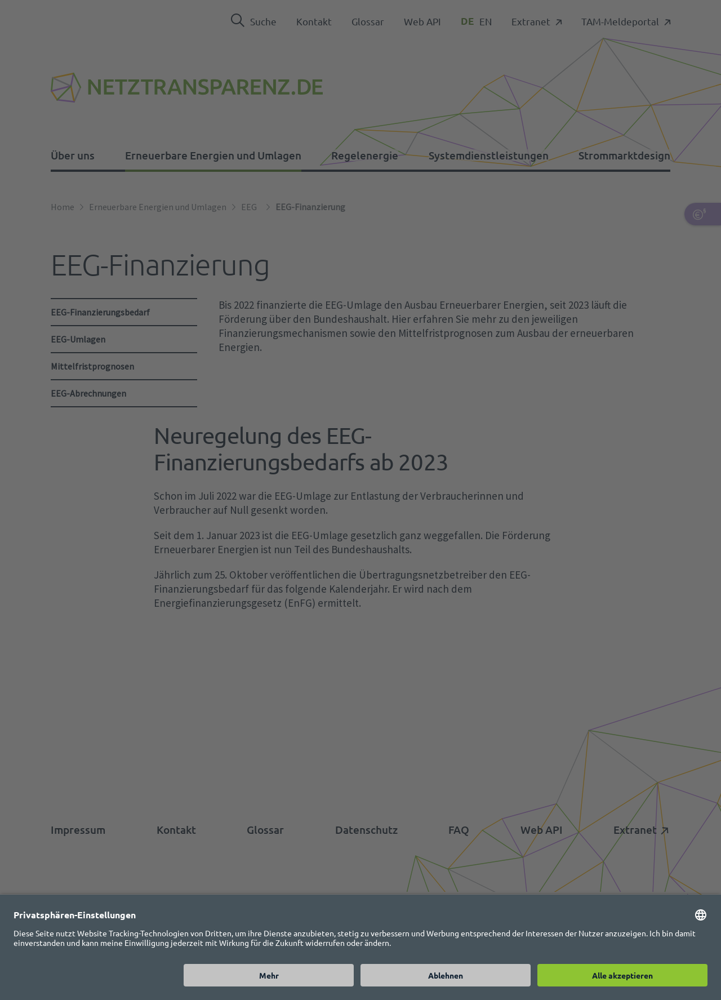

In [ ]:
import asyncio
from pyppeteer import launch
import nest_asyncio
from IPython.display import Image, display

# Apply the nest_asyncio patch to allow nested event loops
nest_asyncio.apply()

async def scraper(url, block_resources=False, timeout=60000):
    try:
        # Launch the browser and create a new page
        browser = await launch(headless=True, args=['--no-sandbox', '--disable-gpu'])
        page = await browser.newPage()

        # Optionally block resources
        if block_resources:
            await page.setRequestInterception(True)
            page.on('request', lambda request: asyncio.ensure_future(
                request.continue_() if request.resourceType in ['document', 'script', 'xhr', 'fetch', 'stylesheet'] else request.abort()
            ))

        # Set the viewport and navigate to the URL
        await page.setViewport({"width": 1280, "height": 720})
        await page.goto(url, timeout=timeout)

        # Wait for the page to load and ensure everything is rendered
        await page.waitForSelector("body", {"timeout": 60000})
        await asyncio.sleep(15)  # Ensure all elements are loaded

        # Extract content from the page
        try:
            # Wait for specific content to be loaded
            await page.waitForSelector("div", {"timeout": 60000})
            content_text = await page.evaluate('''() => {
                let textContent = "";
                const elements = document.querySelectorAll("article, div, p, section");
                elements.forEach(element => {
                    if (element.innerText) {
                        textContent += element.innerText + "\\n";
                    }
                });
                return textContent;
            }''')
        except Exception as e:
            print(f"Error extracting content: {e}")
            content_text = "No content could be extracted."

        print(content_text)

        # Take a screenshot
        screenshot_path = "full-page-screenshot.png"
        await page.screenshot(path=screenshot_path, fullPage=True)

        # Close the browser
        await browser.close()

        return screenshot_path

    except Exception as e:
        print(f"An error occurred: {e}")
        return None

# Define the URL you want to scrape
url = "https://www.netztransparenz.de/de-de/Erneuerbare-Energien-und-Umlagen/EEG/EEG-Finanzierung"

# Run the scraper function
screenshot_path = await scraper(url, block_resources=False, timeout=90000)

if screenshot_path:
    display(Image(screenshot_path))
else:
    print("Screenshot could not be taken.")


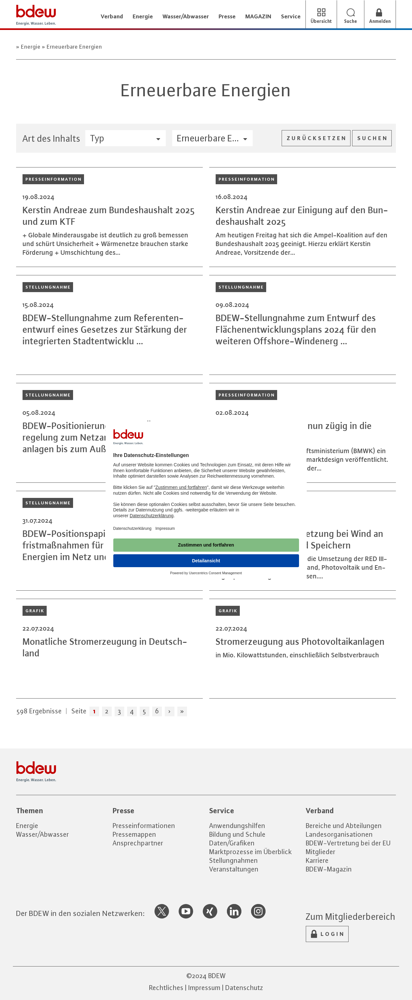

In [ ]:
import asyncio
from pyppeteer import launch
import nest_asyncio
from IPython.display import Image, display

# Apply the nest_asyncio patch to allow nested event loops
nest_asyncio.apply()

async def scraper(url, block_resources=False, timeout=60000):
    try:
        # Launch the browser and create a new page
        browser = await launch(headless=True, args=['--no-sandbox', '--disable-gpu'])
        page = await browser.newPage()

        # Optionally block resources
        if block_resources:
            await page.setRequestInterception(True)
            page.on('request', lambda request: asyncio.ensure_future(
                request.continue_() if request.resourceType in ['document', 'script', 'xhr', 'fetch', 'stylesheet'] else request.abort()
            ))

        # Set the viewport and navigate to the URL
        await page.setViewport({"width": 1280, "height": 720})
        await page.goto(url, timeout=timeout)

        # Wait for the page to load and ensure everything is rendered
        await page.waitForSelector("body", {"timeout": 60000})
        await asyncio.sleep(15)  # Ensure all elements are loaded

        # Extract content from the main content areas
        try:
            content_text = await page.evaluate('''() => {
                let textContent = "";
                const mainContentSelectors = ["main", "article", "section"];
                mainContentSelectors.forEach(selector => {
                    const element = document.querySelector(selector);
                    if (element && element.innerText) {
                        textContent += element.innerText + "\\n";
                    }
                });
                return textContent.trim();  // Remove any trailing whitespace
            }''')
        except Exception as e:
            print(f"Error extracting content: {e}")
            content_text = "No content could be extracted."

        print(content_text)

        # Take a screenshot
        screenshot_path = "full-page-screenshot.png"
        await page.screenshot(path=screenshot_path, fullPage=True)

        # Close the browser
        await browser.close()

        return screenshot_path

    except Exception as e:
        print(f"An error occurred: {e}")
        return None

# Define the URL you want to scrape
url = "https://www.bdew.de/energie/erneuerbare-energien/"

# Run the scraper function
screenshot_path = await scraper(url, block_resources=False, timeout=90000)

if screenshot_path:
    display(Image(screenshot_path))
else:
    print("Screenshot could not be taken.")


## it appeared the above code could not now read all websites only few. So combining all codes which coould read all the websites separately were now merged. (cookie blocker part was left out, since it was figured out that, that was not the problem)


Featured Content
LIVE UPDATES
LIVE UPDATES,
Israeli attacks kill more Palestinians in Gaza amid ceasefire talks
list 1 of 6
Published 6 minutes ago
6m ago
What is UNIFIL?
list 2 of 6
Published 16 minutes ago
16m ago
UN official, peacekeepers in Lebanon urge ‘all to cease fire’
list 3 of 6
Published 26 minutes ago
26m ago
If you’re just joining us
list 4 of 6
Published 36 minutes ago
36m ago
Israeli military says it struck more Hezbollah targets
list 5 of 6
Published 46 minutes ago
46m ago
Israeli attacks keep on causing more civilian causalities
list 6 of 6
Published 56 minutes ago
56m ago
WATCH: Hezbollah launches hundreds of rockets at Israel in retaliatory attack
EXPLAINER
What you need to know about the latest attacks between Israel and Hezbollah
German police arrest 26-year-old man over Solingen stabbing attack
At least 13 killed, 14 missing after boat sinks off Yemen: UN agency
Hamas urges condemnation over Quran burning by Israeli soldiers
Russia-Ukraine war: List of key events,

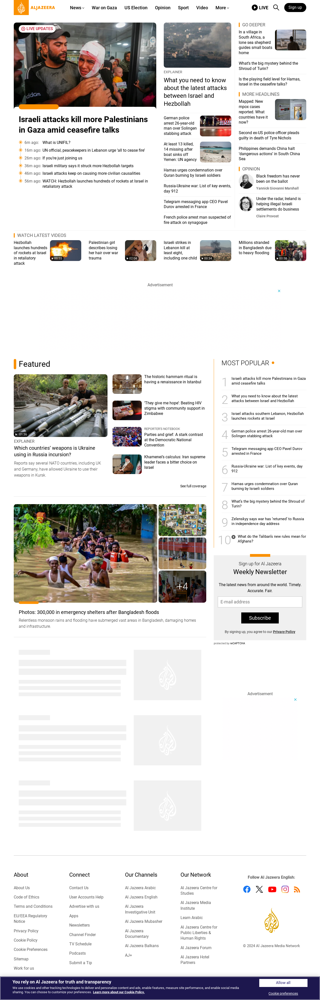

In [6]:
import asyncio
from pyppeteer import launch
import nest_asyncio
from IPython.display import Image, display

# Apply the nest_asyncio patch to allow nested event loops
nest_asyncio.apply()

async def scraper(url, block_resources=False, timeout=60000):
    try:
        # Launch the browser and create a new page
        browser = await launch(headless=True, args=['--no-sandbox', '--disable-gpu'])
        page = await browser.newPage()

        # Optionally block resources
        if block_resources:
            await page.setRequestInterception(True)
            page.on('request', lambda request: asyncio.ensure_future(
                request.continue_() if request.resourceType in ['document', 'script', 'xhr', 'fetch', 'stylesheet'] else request.abort()
            ))

        # Set the viewport and navigate to the URL
        await page.setViewport({"width": 1280, "height": 720})
        await page.goto(url, timeout=timeout)

        # Wait for the page to load and ensure everything is rendered
        await page.waitForSelector("body", {"timeout": 60000})
        await asyncio.sleep(15)  # Ensure all elements are loaded

        # Extract content from the page with flexible selectors
        try:
            content_text = await page.evaluate('''() => {
                let textContent = new Set();  // Use a set to avoid redundancy
                const mainContentSelectors = ["main", "article", "section", "div", "p"];

                mainContentSelectors.forEach(selector => {
                    const elements = document.querySelectorAll(selector);
                    elements.forEach(element => {
                        if (element && element.innerText) {
                            // Add unique non-empty lines to the set to avoid redundancy
                            element.innerText.split('\\n').forEach(line => {
                                if (line.trim()) {
                                    textContent.add(line.trim());
                                }
                            });
                        }
                    });
                });
                return Array.from(textContent).join("\\n");  // Convert set back to string
            }''')
        except Exception as e:
            print(f"Error extracting content: {e}")
            content_text = "No content could be extracted."

        print(content_text)

        # Take a screenshot
        screenshot_path = "full-page-screenshot.png"
        await page.screenshot(path=screenshot_path, fullPage=True)

        # Close the browser
        await browser.close()

        return screenshot_path

    except Exception as e:
        print(f"An error occurred: {e}")
        return None

# Define the URL you want to scrape
url = "https://www.aljazeera.com/"

# Run the scraper function
screenshot_path = await scraper(url, block_resources=False, timeout=90000)

if screenshot_path:
    display(Image(screenshot_path))
else:
    print("Screenshot could not be taken.")


In [2]:
import asyncio
from pyppeteer import launch
import nest_asyncio
import pandas as pd
from google.colab import drive
from IPython.display import Image, display

# Apply the nest_asyncio patch to allow nested event loops
nest_asyncio.apply()

# Mount Google Drive
drive.mount('/content/drive')

async def scraper(url, block_resources=False, timeout=60000):
    try:
        # Launch the browser and create a new page
        browser = await launch(headless=True, args=['--no-sandbox', '--disable-gpu'])
        page = await browser.newPage()

        # Optionally block resources
        if block_resources:
            await page.setRequestInterception(True)
            page.on('request', lambda request: asyncio.ensure_future(
                request.continue_() if request.resourceType in ['document', 'script', 'xhr', 'fetch', 'stylesheet'] else request.abort()
            ))

        # Set the viewport and navigate to the URL
        await page.setViewport({"width": 1280, "height": 720})
        await page.goto(url, timeout=timeout)

        # Wait for the page to load and ensure everything is rendered
        await page.waitForSelector("body", {"timeout": 60000})
        await asyncio.sleep(15)  # Ensure all elements are loaded

        # Extract content from the page with flexible selectors
        try:
            content_text = await page.evaluate('''() => {
                let textContent = new Set();  // Use a set to avoid redundancy
                const mainContentSelectors = ["main", "article", "section", "div", "p"];

                mainContentSelectors.forEach(selector => {
                    const elements = document.querySelectorAll(selector);
                    elements.forEach(element => {
                        if (element && element.innerText) {
                            // Add unique non-empty lines to the set to avoid redundancy
                            element.innerText.split('\\n').forEach(line => {
                                if (line.trim()) {
                                    textContent.add(line.trim());
                                }
                            });
                        }
                    });
                });
                return Array.from(textContent).join("\\n");  // Convert set back to string
            }''')
        except Exception as e:
            print(f"Error extracting content: {e}")
            content_text = "No content could be extracted."

        # Take a screenshot (optional, can be removed if not needed)
        screenshot_path = "full-page-screenshot.png"
        await page.screenshot(path=screenshot_path, fullPage=True)

        # Close the browser
        await browser.close()

        return content_text

    except Exception as e:
        print(f"An error occurred: {e}")
        return "Failed to retrieve content."

# Function to read URLs from Excel, scrape, and save results
async def process_urls(input_excel, output_excel, sheet_name):
    # Read the Excel file
    df = pd.read_excel(input_excel, sheet_name=sheet_name)

    # Ensure the 'url' column exists
    if 'url' not in df.columns:
        print("No 'url' column found in the Excel sheet.")
        return

    # Initialize a list to store results
    results = []

    # Iterate through the URLs and scrape each
    for url in df['url']:
        print(f"Scraping URL: {url}")
        content = await scraper(url)
        results.append(content)

    # Save the results back to a new Excel file
    df['results'] = results
    df.to_excel(output_excel, sheet_name=sheet_name, index=False)
    print(f"Results saved to {output_excel}")

# Define the input and output file paths on Google Drive
input_excel = "/content/drive/My Drive/web_scrapping.xlsx"
output_excel = "/content/drive/My Drive/output.xlsx"
sheet_name = "Deutschland"

# Run the process_urls function
await process_urls(input_excel, output_excel, sheet_name)


Mounted at /content/drive
Scraping URL: https://www.regelleistung.net/de-de/Infos-f%C3%BCr-Anbieter/Aktivierung-der-Reserven/Frequency-Containment-Reserve
Results saved to /content/drive/My Drive/output.xlsx


In [ ]:
import asyncio
from pyppeteer import launch
import nest_asyncio
import pandas as pd
from google.colab import drive
from IPython.display import Image, display

# Apply the nest_asyncio patch to allow nested event loops
nest_asyncio.apply()

# Mount Google Drive
drive.mount('/content/drive')

async def scraper(url, block_resources=False, timeout=90000):
    try:
        # Launch the browser and create a new page
        browser = await launch(headless=True, args=['--no-sandbox', '--disable-gpu'])
        page = await browser.newPage()

        # Optionally block resources
        if block_resources:
            await page.setRequestInterception(True)
            page.on('request', lambda request: asyncio.ensure_future(
                request.continue_() if request.resourceType in ['document', 'script', 'xhr', 'fetch', 'stylesheet'] else request.abort()
            ))

        # Set the viewport and navigate to the URL
        await page.setViewport({"width": 1280, "height": 720})
        await page.goto(url, timeout=timeout)

        # Wait for the page to load and ensure everything is rendered
        await page.waitForSelector("body", {"timeout": 90000})
        await asyncio.sleep(15)  # Ensure all elements are loaded

        # Extract content from the page with flexible selectors
        try:
            content_text = await page.evaluate('''() => {
                let textContent = new Set();  // Use a set to avoid redundancy
                const mainContentSelectors = ["main", "article", "section", "div", "p"];

                mainContentSelectors.forEach(selector => {
                    const elements = document.querySelectorAll(selector);
                    elements.forEach(element => {
                        if (element && element.innerText) {
                            // Add unique non-empty lines to the set to avoid redundancy
                            element.innerText.split('\\n').forEach(line => {
                                if (line.trim()) {
                                    textContent.add(line.trim());
                                }
                            });
                        }
                    });
                });
                return Array.from(textContent).join("\\n");  // Convert set back to string
            }''')
        except Exception as e:
            print(f"Error extracting content: {e}")
            content_text = "No content could be extracted."

        # Take a screenshot
        #screenshot_path = "full-page-screenshot.png"
        #await page.screenshot(path=screenshot_path, fullPage=True)

        # Close the browser
        await browser.close()

        # Display the screenshot (optional, you can remove this if not needed)
        #display(Image(screenshot_path))

        return content_text

    except Exception as e:
        print(f"An error occurred: {e}")
        return "Failed to retrieve content.", None

# Function to read URLs from Excel, scrape, compare, and save results
async def process_urls(input_excel, output_excel, sheet_name):
    # Read the input Excel file
    input_df = pd.read_excel(input_excel, sheet_name=sheet_name)

    # Read or create the output Excel file
    try:
        output_df = pd.read_excel(output_excel, sheet_name=sheet_name)
    except FileNotFoundError:
        # Create an empty dataframe with the required columns if the file does not exist
        output_df = pd.DataFrame(columns=['url', 'results', 'results_new', 'comparison', 'screenshot'])

    # Iterate through the URLs in the input file
    for url in input_df['url']:
        print(f"Processing URL: {url}")

        # Check if the URL is already in the output dataframe
        if url in output_df['url'].values:
            print(f"URL {url} already searched. Checking for changes...")

            # Get the previous new content (results_new)
            previous_content = output_df.loc[output_df['url'] == url, 'results_new'].values[0]

            # Scrape the current content and take a screenshot
            current_content = await scraper(url)

            # Compare the new content with the previous content
            if previous_content == current_content:
                output_df.loc[output_df['url'] == url, 'comparison'] = 'No change'
            else:
                # If there is a change, update the results and results_new columns accordingly
                output_df.loc[output_df['url'] == url, 'results'] = previous_content
                output_df.loc[output_df['url'] == url, 'results_new'] = current_content
                output_df.loc[output_df['url'] == url, 'comparison'] = 'There is a change'

            # Update the screenshot path
            #output_df.loc[output_df['url'] == url, 'screenshot'] = screenshot_path

        else:
            print(f"URL {url} not found in previous records. Scraping and storing content...")
            # Scrape the content and add it to the output dataframe
            content = await scraper(url)
            new_row = pd.DataFrame({
                'url': [url],
                'results': [None],  # Set results as None for first time
                'results_new': [content],  # Store content in results_new for the first time
                'comparison': ['new one']  # Indicate this is a new entry

            })
            output_df = pd.concat([output_df, new_row], ignore_index=True)

    # Save the updated output dataframe back to the Excel file
    output_df.to_excel(output_excel, sheet_name=sheet_name, index=False)
    print(f"Results saved to {output_excel}")

# Define the input and output file paths on Google Drive
input_excel = "/content/drive/My Drive/web_scrapping.xlsx"
output_excel = "/content/drive/My Drive/output.xlsx"
sheet_name = "Deutschland"

# Run the process_urls function
await process_urls(input_excel, output_excel, sheet_name)
